In [1]:
import matplotlib
import numpy as np
import pandas as pd

from tqdm import tqdm 
from copy import deepcopy 
import matplotlib.pyplot as plt

import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import glob

import sys, os, shutil

ROOT_PROJECT =  os.path.join(os.path.normpath(os.path.join(os.getcwd()))) 
sys.path[0] = ROOT_PROJECT


In [3]:
from visualise_results.utils import *

from utilities.misc_utils import save_w_pickle, load_w_pickle

import seaborn as sns; 
sns.set(style="white", palette="dark")

results_dir = "/mnt/data/results_plot_vis/"
results = load_results(results_dir)

// # results.to_csv(results_path)

In [4]:
result_by_method = []for meth_file in glob.glob("./outputs/reproduction/*_optim_res.csv"):    result_by_method.append(pd.read_csv(meth_file, index_col=0))results = pd.concat(result_by_method)results = results.loc[np.sort(results.index.values)]

In [5]:
core_antigens = ["1ADQ_A", "1FBI_X","1H0D_C","1NSN_S","1OB1_C","1WEJ_F","2YPV_A","3RAJ_A","3VRL_C","2DD8_S","1S78_B","2JEL_P"]

a = results.Antigen == core_antigens[0]

for core_antigen in core_antigens[1:]:
    b = results.Antigen == core_antigen
    a = np.logical_or(a, b)

small_table = results[results.Method=="BO_transformed_overlap"][["Method", "Antigen", "Seed", "Num BB Evals", "Last Binding Energy", "Best Binding Energy"]][a]

small_table.to_csv("./core_results.csv")

In [6]:
with open('./utils_data/all_antigens.txt') as file:
    antigens = file.readlines()
    all_antigens = [antigen.rstrip() for antigen in antigens]

# Antigens that are not considered as core antigens
remaining_antigens = list(set(all_antigens)-set(core_antigens))

In [7]:
thresholdPd = pd.read_csv("./utils_data/ListThresholds.txt", sep=" ")

In [8]:
# Labels

def replace_labels(listofL, newL):
     return list(map(lambda x: newL[x], listofL))   

LabelDict = {
    'High Affinity':'High Affinity',
    'Super Affinity':'Super Affinity',
    'BObert':'AntBO ProtBERT',
    'BO_ssk': 'AntBO SSK',
    'BO_transformed_overlap': 'AntBO TK',
    'BO_transformed_overlap_ntr':'AntBO NT',
    'BO_COMBO': 'COMBO',
    'HEBO':'HEBO',
    'TURBO':'TuRBO',
    'GA': 'Genetic Algorithm',
    'RS': 'Random Search',
    'Absolut! 6.9M': 'Absolut! 6.9M',
    'LamBO': 'LamBO'
}

LabelDictinv = {v: k for k, v in LabelDict.items()}

# Colours

colours = sns.color_palette('dark', 12)

colourDINV = {}
ind = 0
for (key,_) in LabelDict.items():
    if key=='Absolut! 6.9M':
        colourDINV[key]=sns.color_palette('rocket')[0]
        continue
    if key=='LamBO':
        colourDINV[key]=sns.color_palette('rocket')[1]
        continue
    colourDINV[key]=colours[ind]
    ind += 1
    
# Markers

markerDINV = {}
all_markers = ['.', 'o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
from matplotlib.lines import Line2D
ind = 0
for (key,_) in LabelDict.items():
    if key=='LamBO':
        markerDINV[key] = all_markers[-1]
        continue
    markerDINV[key]=all_markers[ind]
    ind += 1
    

### Build Table of Results for core antigens

In [9]:
import numpy as np
from fractions import Fraction
from tqdm import tqdm
columns = ['Method']+list(reversed(['Very Very High Affinity+         Top 0.01%', 'Very High - Very Very High Affinity   Top 0.1% ', 'High to Very High Affinity  Top 1%', 'Low to High Affinity     Top 5%', 'Non Binders            Top 95%']))
resultsD = pd.DataFrame(columns=columns)
resultsDVar = pd.DataFrame(columns=columns)
resultsScore = pd.DataFrame(columns=columns)

threshold_names = list(reversed(thresholdPd.type.unique()))
core_comp = [
 'AntBO TK',
 'AntBO SSK',
 'AntBO ProtBERT',
 'AntBO NT',
 'COMBO',
 'HEBO',
 'TuRBO',
 'Genetic Algorithm',
 'Random Search',
 'LamBO'
]
kept_antigen = set()
# labels[2:]
for i, method in enumerate(core_comp):
    method_df = results[results.Method==LabelDictinv[method]]
    row_data = [method]
    var_data = [method]
    score_data = [method]
    for j, threshold_name in enumerate(threshold_names):
        counter_sucess = 0
        timeTaken = 0
        score = 0
        seeds = 0
        for k, antigen in enumerate(core_antigens): 
            try:
                tmp = thresholdPd[thresholdPd.AGname==antigen] 
                if tmp.shape[0]==0:
                    print(f'[NO THRESHOLD] {antigen} for {method}')
                    continue
                min_ha = tmp[tmp.type==threshold_name]['minEnergy'].item()
                if j < len(threshold_names) - 1:
                    max_ha = tmp[tmp.type==threshold_names[j+1]]['maxEnergy'].item()
                    min_ha = max(min_ha, max_ha)                
                    
                antigen_df = method_df[method_df.Antigen==antigen]
                seeds += len(antigen_df['Seed'].unique())
                if len(antigen_df['Seed'].unique()) != 10:
                    print("[NOT ENOUGH SEEDS]", len(antigen_df['Seed'].unique()), method, antigen)

                method_df_new = antigen_df[antigen_df['Best Binding Energy'] < min_ha]
                if method_df_new.shape[0] == 0:
                    # print(f'[Level not reached] Skipping {antigen} for {method} {threshold_name}')
                    continue 
                idx_method = method_df_new.groupby(['Seed'])['Num BB Evals'].min().dropna()
                counter_sucess += idx_method.shape[0]
                if idx_method.shape[0] > 0:
                    timeTaken += idx_method.sum()
            except ValueError as e:
                print(threshold_name, antigen, method, LabelDictinv[method])
                raise e
        
        if counter_sucess==0:
            row_data.append(pd.NA)
            var_data.append(pd.NA)
            score_data.append(pd.NA)
            # row_data.append(' - & - & - ')
        else:
            p_val = counter_sucess/(seeds)
            row_data.append('$%d$ & $%d$ & $%s$'%(round(timeTaken/counter_sucess, 0), round(p_val,2) * 100, round((timeTaken/counter_sucess)/p_val / 100, 2)))
    resultsD.loc[i]=row_data

In [10]:
# resultsD.to_latex()
# print(resultsD.style.hide_index().to_latex().replace("\\$", "$").replace("\\&", "&").replace("<NA>", "- & - & -").replace("\\textbackslash ", "\\").replace("\\{", "{").replace("\\}", "}"))
resultsD.style.hide_index()

Method,Non Binders Top 95%,Low to High Affinity Top 5%,High to Very High Affinity Top 1%,Very High - Very Very High Affinity Top 0.1%,Very Very High Affinity+ Top 0.01%
AntBO TK,$20$ & $100$ & $0.2$,$29$ & $100$ & $0.29$,$41$ & $99$ & $0.42$,$58$ & $96$ & $0.6$,$97$ & $55$ & $1.76$
AntBO SSK,$21$ & $100$ & $0.21$,$30$ & $100$ & $0.3$,$46$ & $100$ & $0.46$,$64$ & $96$ & $0.67$,$94$ & $48$ & $1.94$
AntBO ProtBERT,$24$ & $100$ & $0.24$,$37$ & $97$ & $0.39$,$60$ & $88$ & $0.69$,$84$ & $73$ & $1.14$,$121$ & $24$ & $5.02$
AntBO NT,$19$ & $100$ & $0.19$,$28$ & $99$ & $0.29$,$43$ & $98$ & $0.44$,$61$ & $95$ & $0.64$,$111$ & $52$ & $2.15$
COMBO,$44$ & $92$ & $0.48$,$56$ & $56$ & $0.97$,$67$ & $15$ & $4.44$,$99$ & $3$ & $39.47$,
HEBO,$15$ & $100$ & $0.15$,$25$ & $100$ & $0.25$,$50$ & $100$ & $0.5$,$74$ & $97$ & $0.75$,$130$ & $56$ & $2.33$
TuRBO,$34$ & $100$ & $0.34$,$65$ & $99$ & $0.65$,$109$ & $79$ & $1.37$,$124$ & $40$ & $3.11$,$112$ & $1$ & $134.4$
Genetic Algorithm,$34$ & $100$ & $0.34$,$70$ & $99$ & $0.7$,$111$ & $92$ & $1.21$,$140$ & $56$ & $2.48$,$141$ & $4$ & $33.79$
Random Search,$37$ & $100$ & $0.37$,$71$ & $78$ & $0.9$,$84$ & $23$ & $3.61$,$99$ & $3$ & $39.6$,
LamBO,$19$ & $100$ & $0.19$,$32$ & $100$ & $0.32$,$55$ & $100$ & $0.55$,$73$ & $94$ & $0.78$,$101$ & $51$ & $1.99$


### Regret curves on core antigens

In [11]:
core_antigens_w_space = ['1ADQ_A','', '1FBI_X','', 
 '1H0D_C','', 
 '1NSN_S','', 
 '1OB1_C','', 
 '1WEJ_F','', 
 '2YPV_A','', 
 '3RAJ_A','', 
 '3VRL_C','', 
 '2DD8_S','', 
 '1S78_B','', 
 '2JEL_P','']

  0%|          | 0/12 [00:00<?, ?it/s]<ipython-input-12-c0243b796f08>:58: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered = results[results['Antigen']==antigen][results["Method"] != "LamBO"]
  8%|▊         | 1/12 [00:37<06:48, 37.14s/it]<ipython-input-12-c0243b796f08>:58: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filtered = results[results['Antigen']==antigen][results["Method"] != "LamBO"]
  8%|▊         | 1/12 [00:42<07:49, 42.72s/it]


KeyboardInterrupt: 

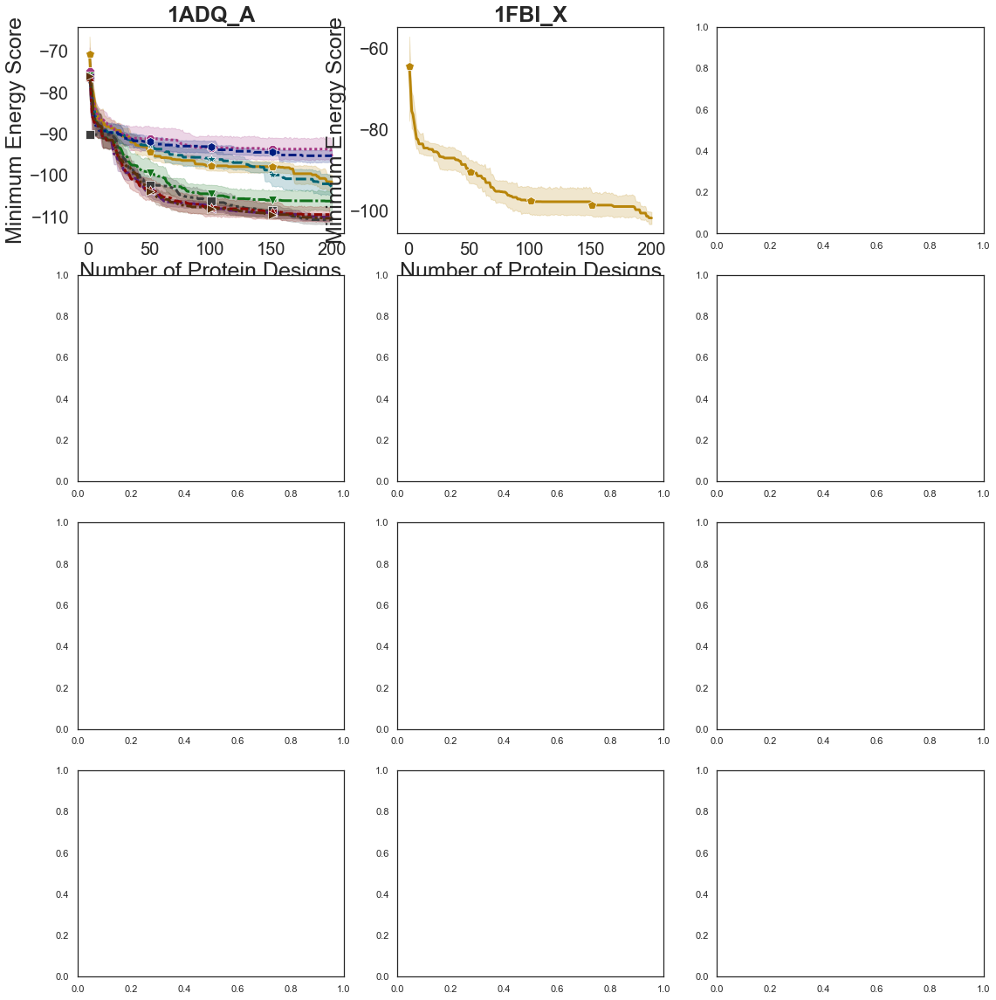

In [12]:
xticks_labels_size = 20
yticks_labels_size = 20
fsize = 25
sns.set_style("white")

cols = 3
rows = 4
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize = (6.2*cols, 5*rows))
axs = axs.reshape(rows, cols)
row, col = 0, 0

for antigen in tqdm(core_antigens):
    ax = axs[row, col] 
    if col == (cols-1):
        row += 1
        col = 0
    else:
        col += 1
    # Plot Absolut! Best
    min_best_affin = None
    try:
        tmp = thresholdPd[thresholdPd.AGname==antigen] 
        max_high_aff = tmp[tmp.type=='Heroes']['maxEnergy'].item()
        max_sh_affin = tmp[tmp.type=='SuperHeroes']['maxEnergy'].item()
        min_best_affin = tmp[tmp.type=='SuperHeroes']['minEnergy'].item()
#         ax.plot(list(range(0, f_evals)), f_evals * [max_high_aff], marker=markerDINV['High Affinity'], markevery=50, markersize=10,
#                  color=colourDINV['High Affinity'], linestyle='--', linewidth=3)
#         ax.plot(list(range(0, f_evals)), f_evals * [max_sh_affin], marker=markerDINV['Super Affinity'], markevery=50, markersize=10,
#                  color=colourDINV['Super Affinity'], linestyle='--', linewidth=3)
    except:
        pass
    
    # sequences = None
    # filenames = glob.glob(f"/mnt/data/CDRdata/RawBindingsMurine/{antigen}/*.txt")
#     for i in range(len(filenames)):
#         if i == 0:
#             sequences = pd.read_csv(filenames[i], skiprows=1, sep='\t')
#         else:
#             sequences.append(pd.read_csv(filenames[i], skiprows=1, sep='\t'))
    
#     min_energy = np.inf
#     if (sequences is not None) or (min_best_affin is not None):
#         if sequences is not None:
#             min_energy = min(min_energy, sequences['Energy'].values.min())
#         if min_best_affin is not None:
#             min_energy = min(min_energy, min_best_affin)
        # f_evals = 200
#         ax.plot(list(range(0, f_evals)), f_evals * [min_energy], marker=markerDINV['Absolut! 6.9M'], markevery=50, markersize=10,
#                  color=sns.color_palette('rocket')[0], linestyle='--', linewidth=3)        

    #Plot optimisers best
    ax.set_title(f"{antigen}", fontsize=fsize, fontweight="bold")
    ax.set_xlabel('Number of Protein Designs', fontsize=fsize)
    ax.set_ylabel('Minimum Energy Score', fontsize=fsize)
    ax.tick_params(axis='x', which='major', labelsize=xticks_labels_size)
    ax.tick_params(axis='y', which='major', labelsize=yticks_labels_size)
#     ax.grid()
    filtered = results[results['Antigen']==antigen][results["Method"] != "LamBO"]
    ax = sns.lineplot(data=filtered, ax=ax,  x='Num BB Evals', y='Best Binding Energy', hue = "Method", legend=False, linewidth=3, palette=colourDINV, style='Method', markers=markerDINV, markevery=50, markersize=10)
#     filtered = results[results['Antigen'].isin(core_antigens)]
#     filtered = filtered[~filtered['Method'].isin(core_optimisers)]
        

#     handles, labels = ax.get_legend_handles_labels()
#     ax.get_legend().set_visible(False)
#     plt.show()
#     break

# ax.plot([], linestyle='--', color=colourDINV['High Affinity'], marker=markerDINV['High Affinity'], linewidth=5, markersize=20, label='Very High Affinity')
# ax.plot([], linestyle='--', color=colourDINV['Super Affinity'], marker=markerDINV['Super Affinity'], linewidth=5, markersize=20, label='Super Affinity')
# ax.plot([], linestyle='--', color=sns.color_palette('rocket')[0], marker=markerDINV['Absolut! 6.9M'], linewidth=5, markersize=20, label='Super+ Affinity')

for label_n in LabelDict.keys():
    if label_n in ['Absolut! 6.9M', 'Super Affinity', 'High Affinity', 'LamBO']:
        pass
    else:
        ax.plot([], color=colourDINV[label_n], marker=markerDINV[label_n], label=LabelDict[label_n], linewidth=5, markersize=20)
    

handles, labels = ax.get_legend_handles_labels()

import math
n_col_legend = math.ceil(len(labels)/2)
lgd = fig.legend(handles, labels, bbox_to_anchor=(0.5, 0.0), ncol=n_col_legend, loc='upper center', fancybox=True, shadow=True, fontsize=25)
fig.tight_layout()
# plt.savefig(os.path.join("./plots", "binding_vs_funct_evals.pdf"), bbox_extra_artists=(lgd, ), pad_inches=0.1, bbox_inches='tight')
plt.show()

### Creating hex-plots for core antigens

In [21]:
order_all = [
 'BO_transformed_overlap',
 'BO_ssk',
 'BObert',
 'BO_COMBO',
 'HEBO',
 'TURBO',
 'GA'
]

In [14]:
dds_thr = thresholdPd[thresholdPd.AGname == "2DD8_S"][thresholdPd.type == "SuperHeroes"].maxEnergy.item()

root_path = "./extra_data/2DD8_S/"
sample_path = os.path.join(root_path, "2DD8_SFinalBindings_Process_1_Of_32.txt")
if os.path.exists(sample_path):

    energies = []
    seqs = []

    for i in tqdm(range(1, 33)):
        ind = 0
        with open(f"./extra_data/2DD8_S/2DD8_SFinalBindings_Process_{i}_Of_32.txt", "r") as f:
            for line in f.readlines():
                line = line[:-1]
                ind += 1
                if ind < 2:
                    continue
                if ind == 2:
                    cols = line.split("\t")
                    continue
                res = line.split("\t")
                energy = float(res[-2])
                if energy <= dds_thr:
                    energies.append(energy)
                    seqs.append(res[3])

    energies = np.array(energies)
    seqs = np.array(seqs)

    inds = np.arange(len(energies))
    best_energies = energies[inds]
    best_seqs = seqs[inds]

    scores = compute_scores(best_seqs)
    mean_best_scores = {k: np.mean(scores[k]) for k in scores}
    mean_best_scores["energy"] = np.mean(best_energies)

<ipython-input-14-f2565a243de2>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  dds_thr = thresholdPd[thresholdPd.AGname == "2DD8_S"][thresholdPd.type == "SuperHeroes"].maxEnergy.item()


In [15]:
mean_best_scores = {"2DD8_S": load_w_pickle("./utils_data/2DD8_S_super_binders_char.pkl")}

In [16]:
developability_scores = ["Last Instability Index", "Last Charge", "Last Hydropathicity"]

100%|██████████| 1/1 [00:13<00:00, 13.44s/it]


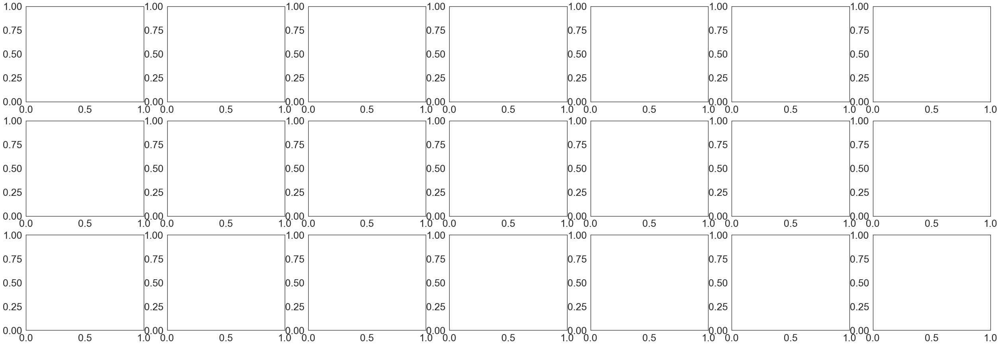

In [20]:
from tqdm import tqdm

os.makedirs("./hex_plots", exist_ok=True)

for antigen in tqdm(core_antigens):
    antigen_res = results[results['Antigen']==antigen]
    row, col = 0, 0
    cols = len(order_all)
    rows = len(developability_scores)
    fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize = (6.2*cols, 5*rows))
    axs = axs.reshape(rows, cols)
    with sns.axes_style("ticks"):
        for row, name in enumerate(developability_scores):
            col = 0
            for method in order_all:
                if method in ['Random Search', "LamBO"]:
                    continue 
                color = colourDINV[method]
                ax = axs[row, col] 
                filtered = antigen_res[antigen_res['Method']==method]
                g = sns.jointplot(data=filtered, x="Last Binding Energy", y=name, kind="hex", color=color)
                if antigen in mean_best_scores:
                    if name == "Last Instability Index":
                        data_dds_name = mean_best_scores[antigen]["instability"]
                    elif name == "Last Hydropathicity":
                        data_dds_name = mean_best_scores[antigen]["hydropathicity"]
                    elif name == "Last Charge":
                        data_dds_name = mean_best_scores[antigen]["charge"]
                    else:
                        raise ValueError(name)
                    
                    g.figure.gca().scatter(mean_best_scores[antigen]["energy"], data_dds_name, marker="*", s=900, c="blue")

                matplotlib.rc('xtick', labelsize=fsize)
                matplotlib.rc('ytick', labelsize=fsize)

    #             g.ax_joint.axes.set_xlabel('Last Binding Energy', fontsize=16)
    #             g.ax_joint.axes.set_ylabel(name, fontsize=16)
                g.ax_joint.axes.set_xlabel('', fontsize=fsize)
                g.ax_joint.axes.set_ylabel('', fontsize=fsize)
    #             g.ax_joint.axes.set_title(f"{method} 2DD8_S", fontsize=16)
                g.ax_joint.axes.invert_xaxis()
                g.savefig(f'./hex_plots/hex_{row}_{col}_{antigen}.png')
                plt.close(g.fig)
                col += 1


  0%|                                                                                                                           | 0/12 [00:00<?, ?it/s]

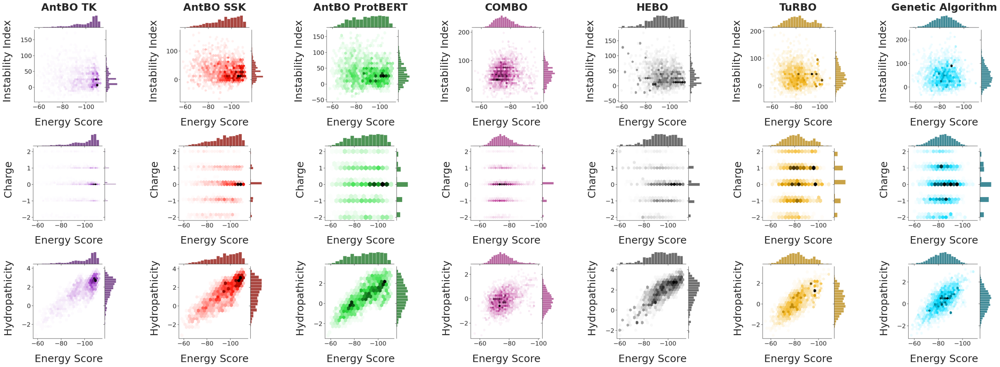

  8%|█████████▌                                                                                                         | 1/12 [00:03<00:43,  3.91s/it]

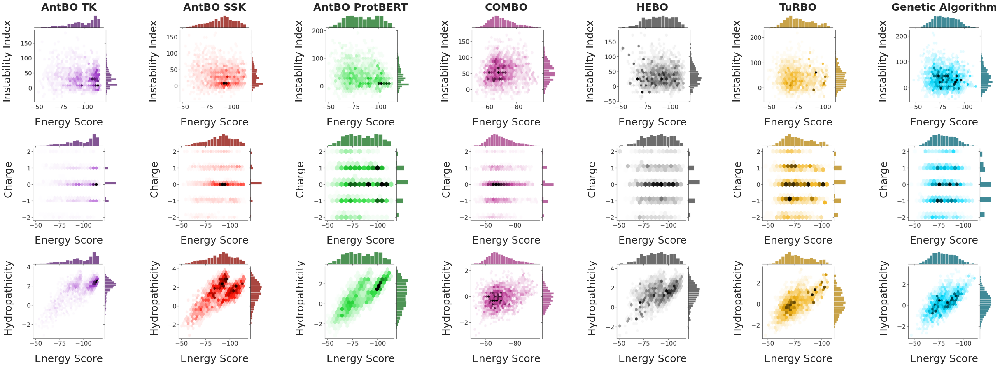

 17%|███████████████████▏                                                                                               | 2/12 [00:07<00:39,  3.91s/it]

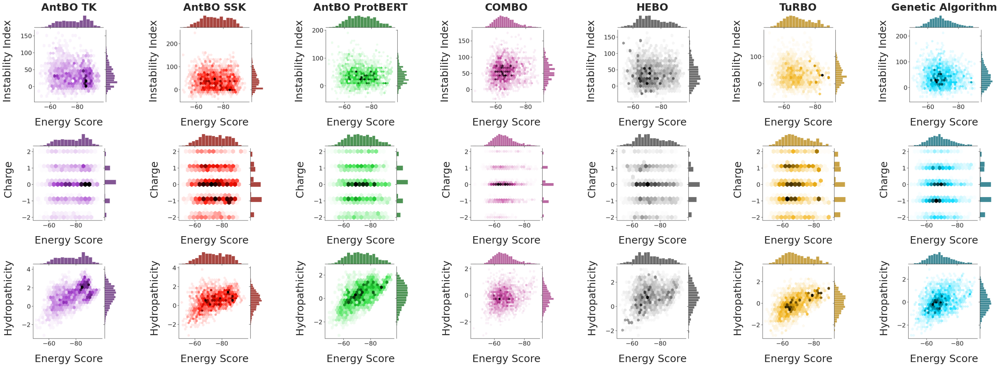

 25%|████████████████████████████▊                                                                                      | 3/12 [00:11<00:35,  3.91s/it]

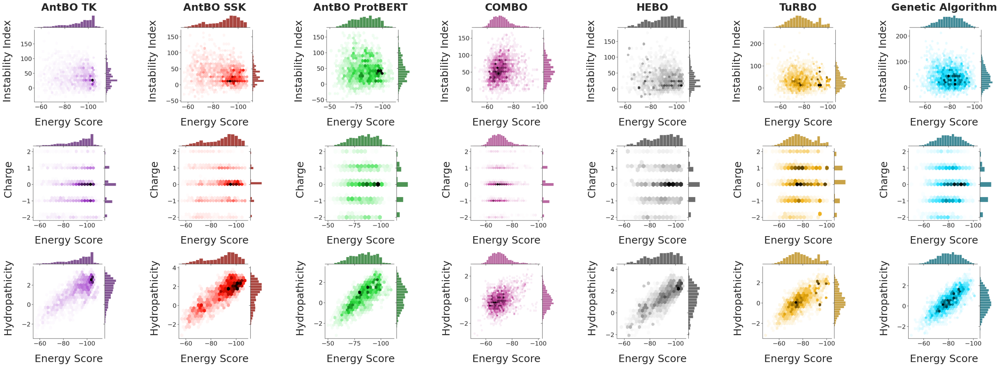

 33%|██████████████████████████████████████▎                                                                            | 4/12 [00:15<00:31,  3.90s/it]

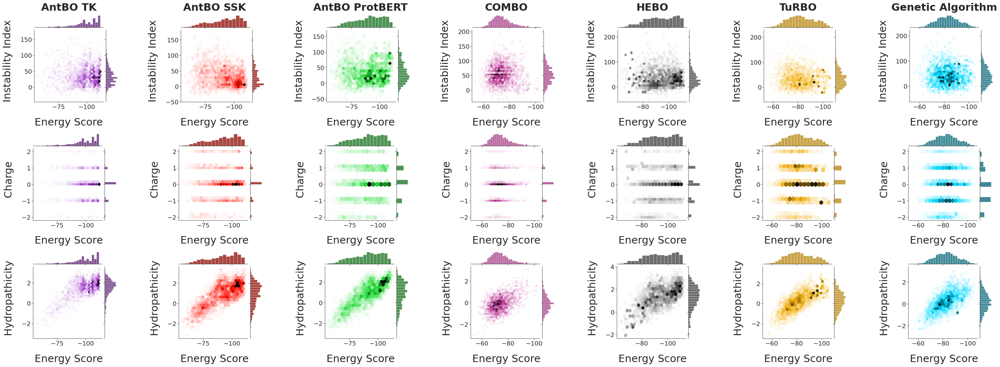

 42%|███████████████████████████████████████████████▉                                                                   | 5/12 [00:19<00:27,  3.90s/it]

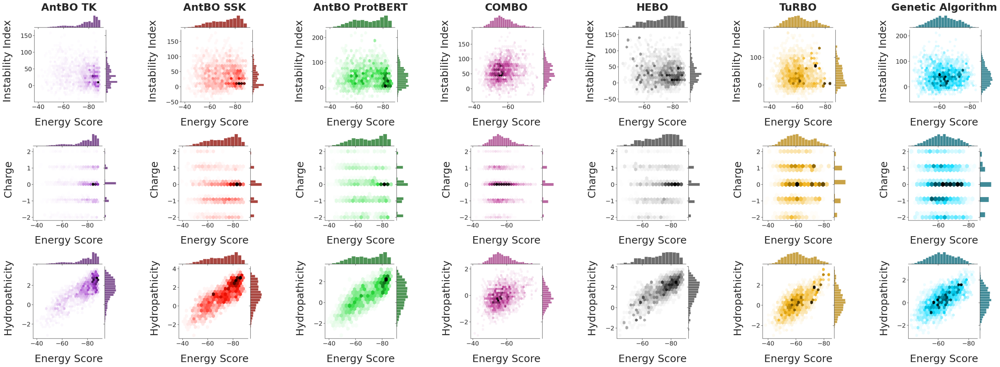

 50%|█████████████████████████████████████████████████████████▌                                                         | 6/12 [00:23<00:23,  3.89s/it]

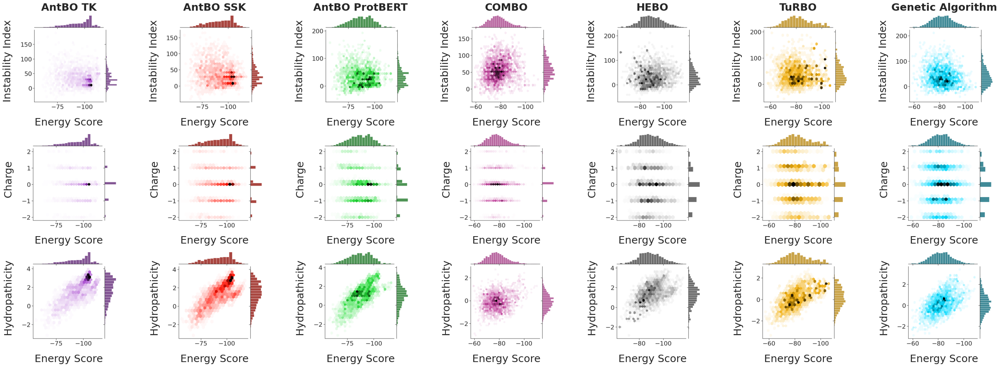

 58%|███████████████████████████████████████████████████████████████████                                                | 7/12 [00:27<00:19,  3.89s/it]

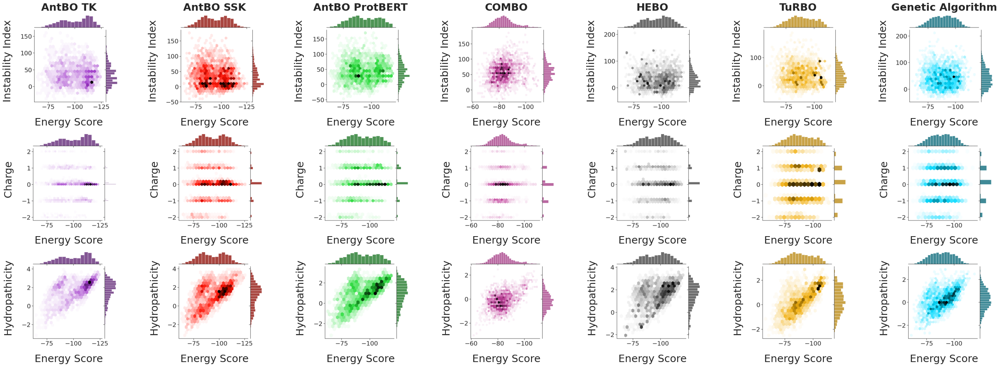

 67%|████████████████████████████████████████████████████████████████████████████▋                                      | 8/12 [00:31<00:15,  3.90s/it]

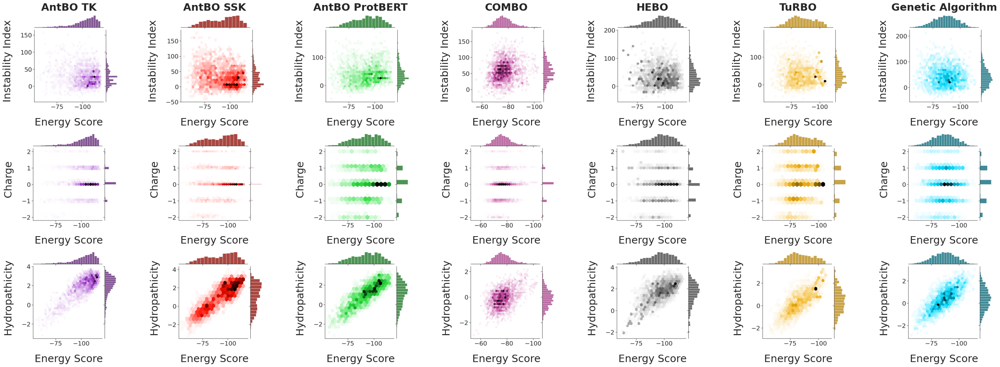

 75%|██████████████████████████████████████████████████████████████████████████████████████▎                            | 9/12 [00:35<00:11,  3.90s/it]

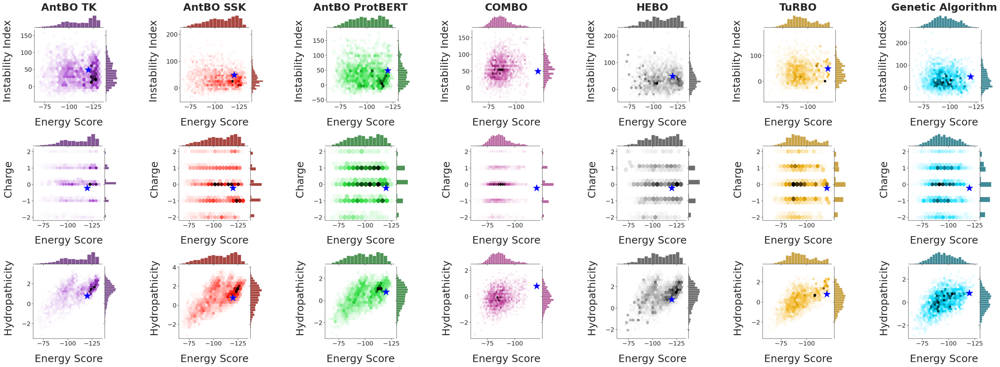

 83%|███████████████████████████████████████████████████████████████████████████████████████████████                   | 10/12 [00:38<00:07,  3.90s/it]

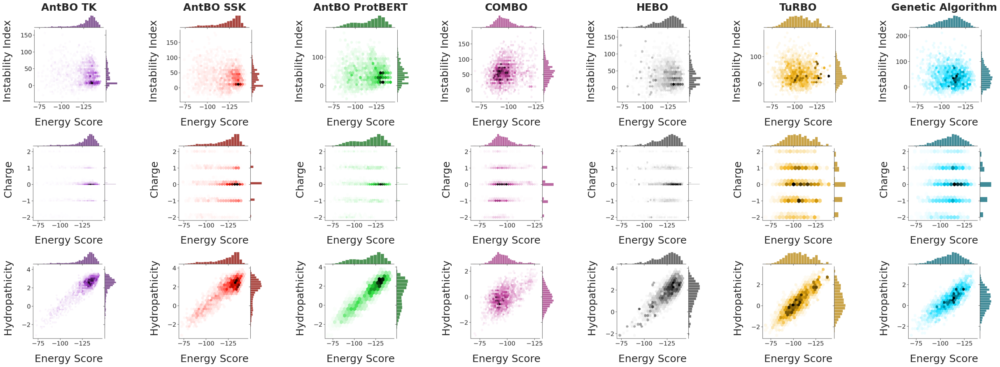

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 11/12 [00:42<00:03,  3.90s/it]

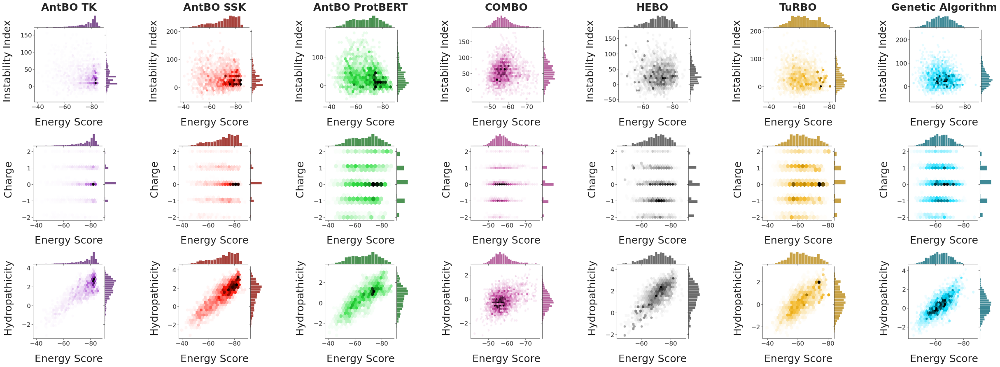

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:46<00:00,  3.90s/it]


In [95]:
with sns.axes_style("dark"):
    for antigen in tqdm(core_antigens):
        cols = len(order_all)
        rows = len(developability_scores)
        fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize = (6.2*cols, 5*rows))
        axs = axs.reshape(rows, cols)
        row, col = 0, 0
        for row, name in enumerate(developability_scores):
            col = 0
            for method in order_all:
                if method=='Random Search':
                    continue 
                ax = axs[row, col] 
                if row==0:
                    ax.set_title(f"{LabelDict[method]}", fontsize=fsize,fontweight="bold")
                else:
                    ax.set_title(f" ", fontsize=fsize)
    #             if row==2:
                ax.set_xlabel('Energy Score', fontsize=fsize)
    #             else:
    #                 ax.set_xlabel(' ', fontsize=16)
                name = name.replace('Last ',' ')

                ax.set_ylabel(name, fontsize=fsize)

                ax.imshow(mpimg.imread(f'./hex_plots/hex_{row}_{col}_{antigen}.png'))
                ax.axes.xaxis.set_ticklabels([])
                ax.axes.yaxis.set_ticklabels([])
                col += 1


        plt.savefig(os.path.join("./plots", f"dev_scores_{antigen}.pdf"))
        plt.show()

### Make heatmap plot for energy scores

In [22]:
methods = [
    'BO_transformed_overlap',
    'BO_ssk', 
    'BObert',
    'BO_transformed_overlap_ntr',
    'BO_COMBO',
    'HEBO',
    'TURBO',
    'GA',
    'RS',
]

In [23]:
energy_data = pd.DataFrame(columns=core_antigens)

very_high = []
super_en = []
super_plus = []

best_vals = []

for antigen in core_antigens:
    filt = thresholdPd[thresholdPd.AGname == antigen]
    best_val = filt[filt.type=='SuperHeroes']['minEnergy'].item()
    best_vals.append(best_val)
    very_high.append(filt[filt.type=='Heroes']['maxEnergy'].item() / best_val)
    super_en.append(filt[filt.type=='SuperHeroes']['maxEnergy'].item() / best_val)
    super_plus.append(1)
    
for method in tqdm(methods):
    energy_per_antigen = []
    for ind, antigen in enumerate(core_antigens):
        filt = results[results.Method == method][results.Antigen == antigen]
        assert np.all(np.sort(filt.Seed.unique()) == np.arange(42, 52))
        energy_per_antigen.append(filt.groupby("Seed")['Best Binding Energy'].min().mean() / best_vals[ind])
    energy_data.loc[LabelDict[method]] = energy_per_antigen
            

energy_data.loc["Very High"] = very_high
energy_data.loc["Super"] = super_en
energy_data.loc["Super+"] = super_plus

  0%|          | 0/9 [00:00<?, ?it/s]<ipython-input-23-5572a499db7b>:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  filt = results[results.Method == method][results.Antigen == antigen]
100%|██████████| 9/9 [00:09<00:00,  1.05s/it]


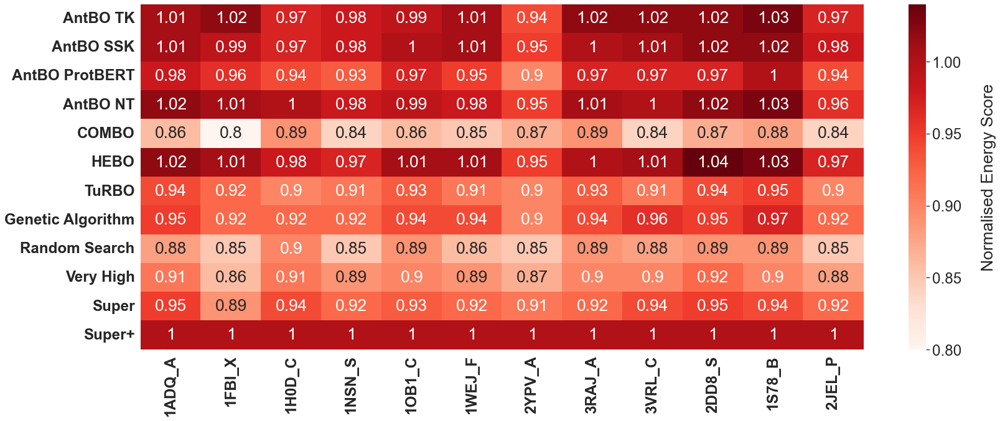

In [25]:
os.makedirs("./plots", exist_ok=True)

sns.set(font_scale=2.2)
fig, ax = plt.subplots(figsize=(24, 10))

ax = sns.heatmap(energy_data.round(2), annot=True, fmt="g", cmap="Reds", 
            cbar_kws={"label": "\nNormalised Energy Score"}, )
plt.xticks(weight="bold")
plt.yticks(weight="bold")


fig.tight_layout()
plt.savefig("./plots/binding_energy_heatmap.pdf", bbox_inches='tight')
plt.show()
sns.set(font_scale=1)

### Make regret plots for remaining antigens

In [117]:
selected_methods = ["BO_transformed_overlap", "RS", "GA"]
filtr = results.Method == selected_methods[0]
for method in selected_methods[1:]:
    filtr = np.logical_or(filtr, results.Method == method)
    
filtr_results = results[filtr]

 13%|███████████████▏                                                                                                 | 24/179 [04:41<29:27, 11.40s/it]

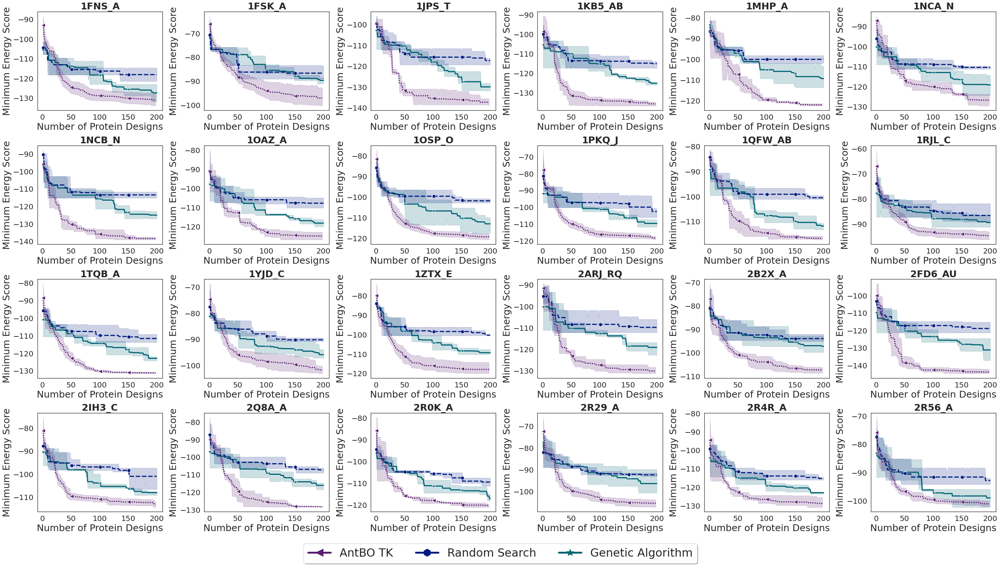

 27%|██████████████████████████████▉                                                                                  | 49/179 [09:40<26:01, 12.02s/it]

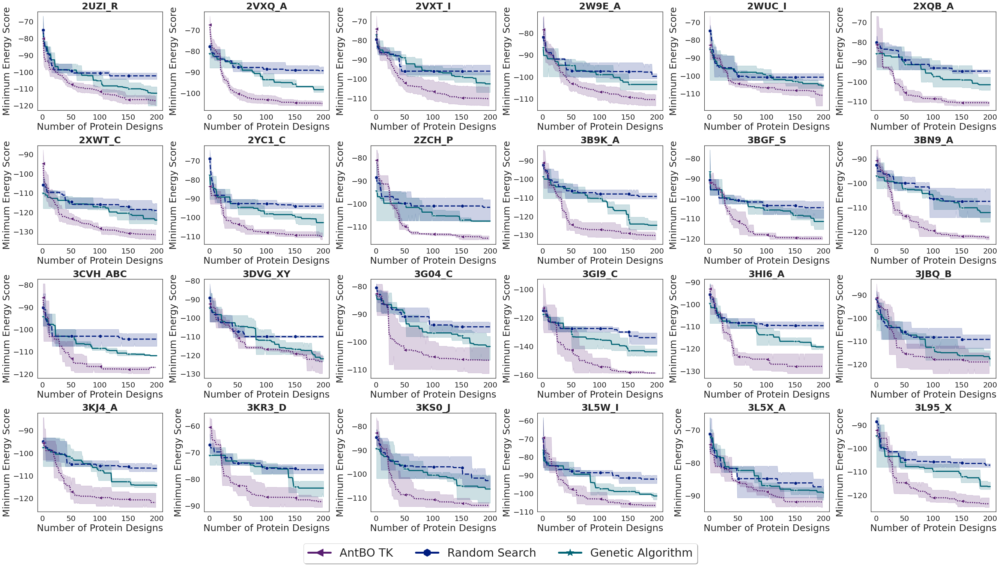

 41%|██████████████████████████████████████████████                                                                   | 73/179 [14:40<21:39, 12.26s/it]

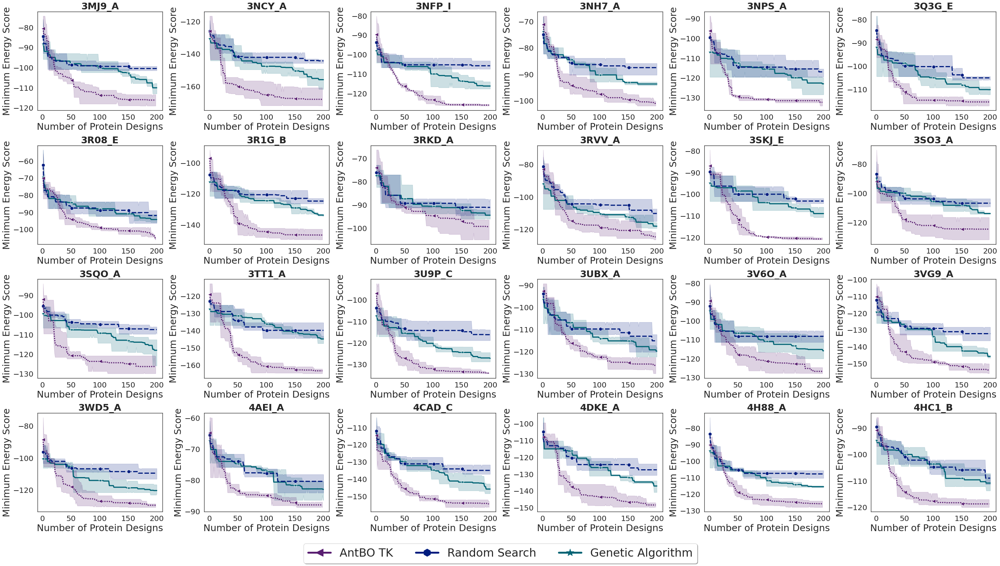

 54%|█████████████████████████████████████████████████████████████▏                                                   | 97/179 [19:38<16:41, 12.22s/it]

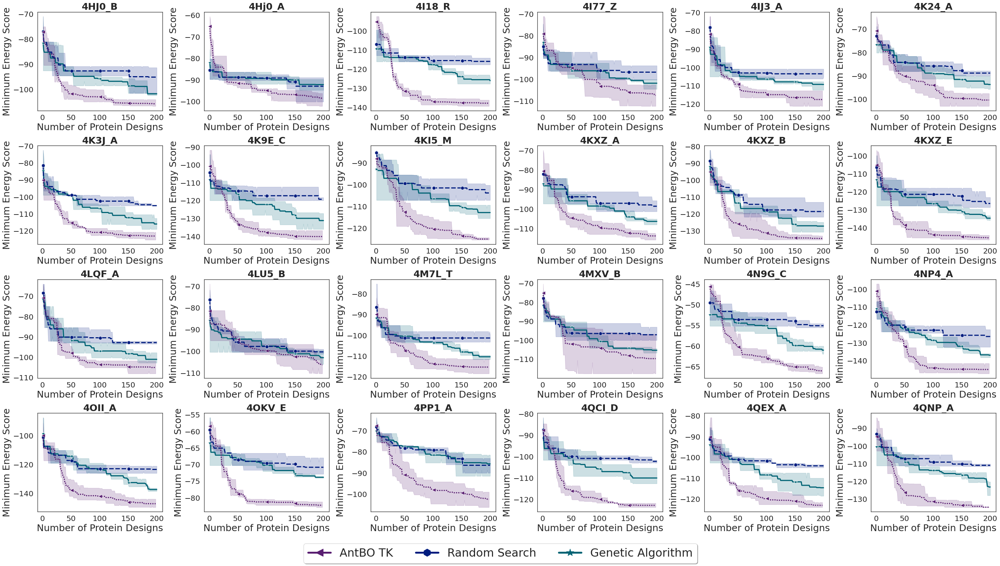

 68%|███████████████████████████████████████████████████████████████████████████▋                                    | 121/179 [24:38<11:49, 12.24s/it]

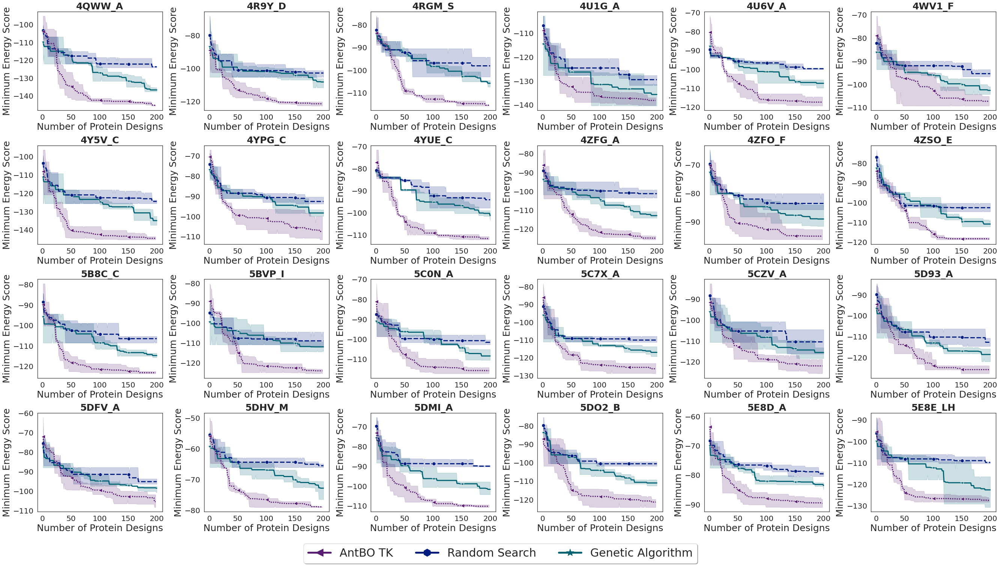

 82%|███████████████████████████████████████████████████████████████████████████████████████████▎                    | 146/179 [29:37<06:30, 11.82s/it]

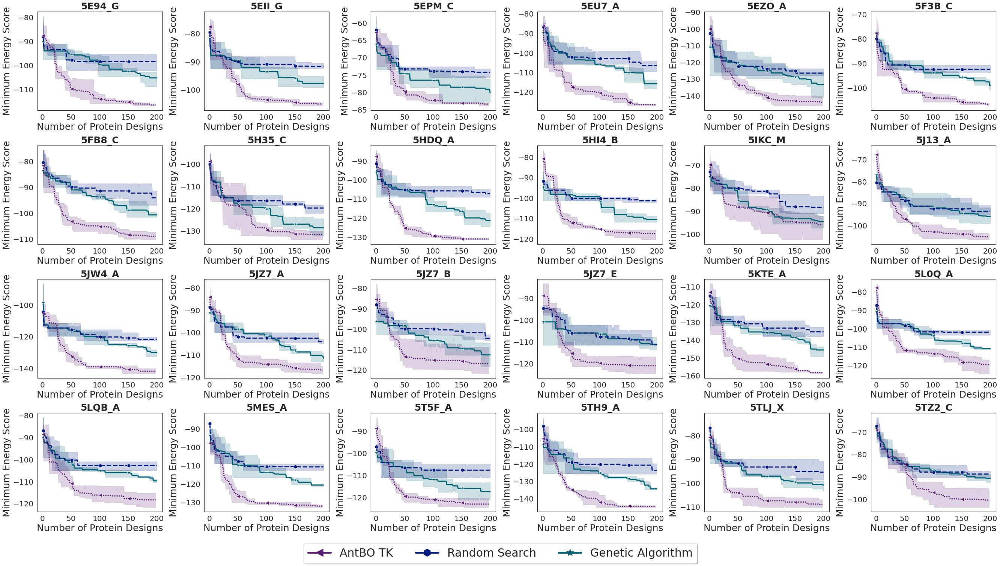

 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 170/179 [34:37<01:50, 12.25s/it]

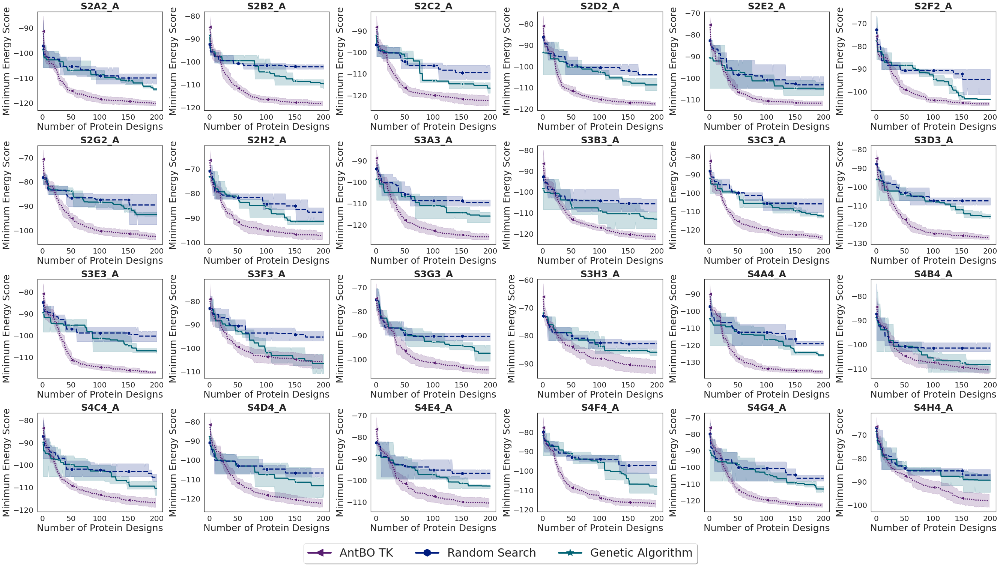

 99%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 178/179 [36:20<00:12, 12.36s/it]

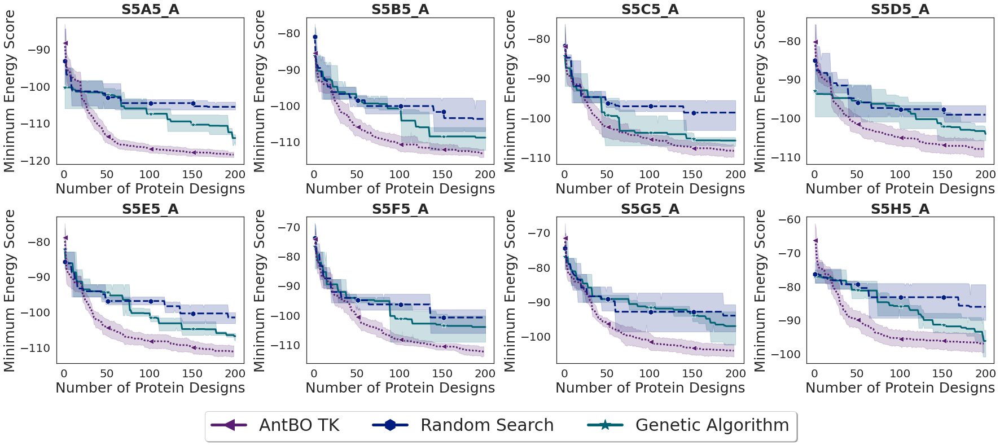

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 179/179 [36:34<00:00, 12.26s/it]


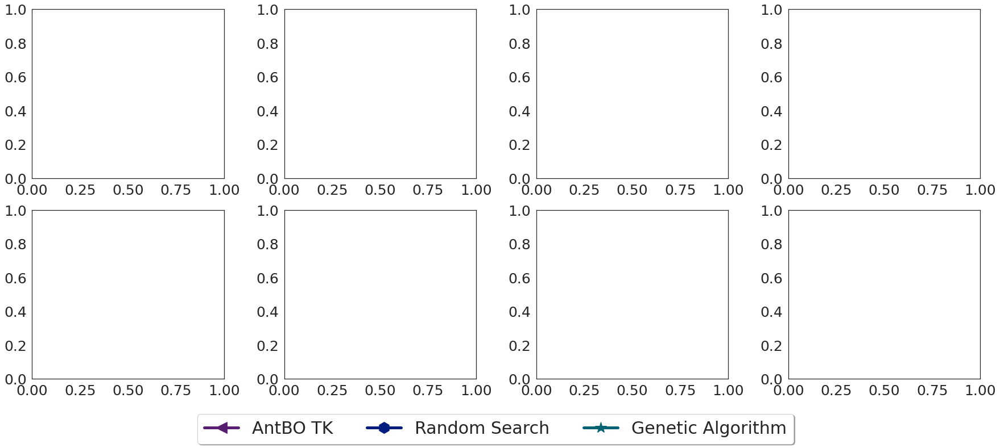

figC in last image 0
Skipped Antigens ['2HFG_R', '3EFD_K', '5KN5_C']


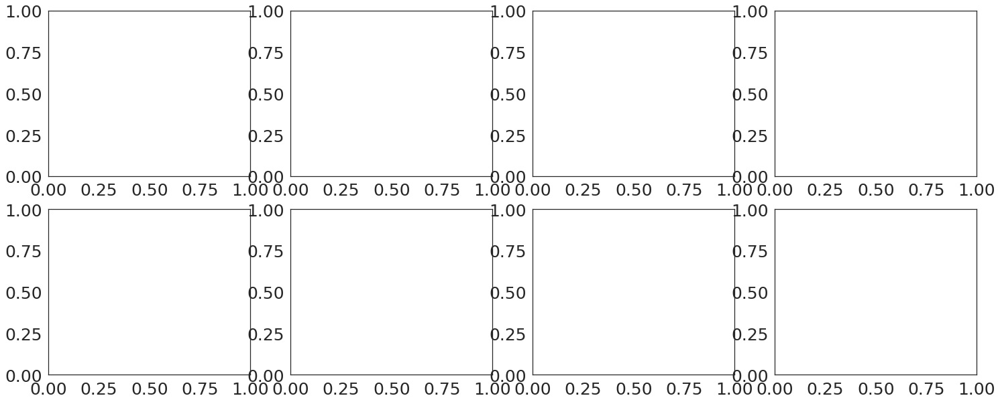

In [119]:
# Plot over all antigens 
import numpy as np
from tqdm import tqdm 
from copy import deepcopy 

# Markers = {'+','o','*','x','v','d','^','s','>','<'}
cols = 6
rows = 4
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize = (6.2*cols, 5*rows))
axs = axs.reshape(rows, cols)
matplotlib.rc('xtick', labelsize=fsize)
matplotlib.rc('ytick', labelsize=fsize)
row, col = 0, 0
fsize = 25
figC = 0
resetC = 0
total_figures = 0
skipped_antigens = []
remaining_antigens = list(sorted(remaining_antigens))
for antigen in tqdm(remaining_antigens):
    filtered = filtr_results[filtr_results['Antigen']==antigen]
    
    if filtered.shape[0]>0:
        ax = axs[row, col] 
        if col == (cols-1):
            row += 1
            col = 0
        else:
            col += 1
        # Plot Absolut! Best
        # min_best_affin = None
        # try:
        #     tmp = thresholdPd[thresholdPd.AGname==antigen] 
        #     max_high_aff = tmp[tmp.type=='Heroes']['maxEnergy'].item()
        #     max_sh_affin = tmp[tmp.type=='SuperHeroes']['maxEnergy'].item()
        #     min_best_affin = tmp[tmp.type=='SuperHeroes']['minEnergy'].item()
#             ax.plot(list(range(0, f_evals)), f_evals * [max_high_aff], marker=markerDINV['High Affinity'], markevery=50, markersize=10,
#                      color=colourDINV['High Affinity'], linestyle='--', linewidth=3)
#             ax.plot(list(range(0, f_evals)), f_evals * [max_sh_affin], marker=markerDINV['Super Affinity'], markevery=50, markersize=10,
#                      color=colourDINV['Super Affinity'], linestyle='--', linewidth=3)
#             print(antigen, max_high_aff, max_sh_affin, min_best_affin)
        # except:
        #     pass

        # sequences = None
        # filenames = glob.glob(f"/mnt/data/CDRdata/RawBindingsMurine/{antigen}/*.txt")
        # for i in range(len(filenames)):
        #     try:
        #         if i == 0:
        #             sequences = pd.read_csv(filenames[i], skiprows=1, sep='\t')
        #         else:
        #             sequences.append(pd.read_csv(filenames[i], skiprows=1, sep='\t'))
        #     except:
        #         pass 
        # min_energy = np.inf
        # if (sequences is not None) or (min_best_affin is not None):
        #     if sequences is not None:
        #         min_energy = min(min_energy, sequences['Energy'].values.min())
        #     if min_best_affin is not None:
        #         min_energy = min(min_energy, min_best_affin)
        #     # min_energy *= -1.0
        #     f_evals = 200
        #     try:
        #         assert min_energy<max_high_aff
#                 ax.plot(list(range(0, f_evals)), f_evals * [min_energy], marker=markerDINV['Absolut! 6.9M'], markevery=50, markersize=10,
#                          color=sns.color_palette('rocket')[0], linestyle='--', linewidth=3)    
        #     except:
        #         pass
        #     print(antigen, min_energy,max_high_aff)
        # else:
        #     pass 
        
        
        ax.set_title(f"{antigen}", fontsize=fsize, fontweight="bold")
        ax.set_xlabel('', fontsize=fsize)
        ax.set_ylabel('', fontsize=fsize)
#         ax.grid()
        ax = sns.lineplot(data=filtered, ax=ax,  x='Num BB Evals', y='Best Binding Energy', hue = "Method", legend=False, linewidth=3, palette=colourDINV, style='Method', markers=markerDINV, markevery=50, markersize=10)
        total_figures += 1 
        ax.set_xlabel('Number of Protein Designs', fontsize=fsize)
        ax.set_ylabel('Minimum Energy Score', fontsize=fsize)
        ax.tick_params(axis='x', which='major', labelsize=xticks_labels_size)
        ax.tick_params(axis='y', which='major', labelsize=yticks_labels_size)

        figC += 1
#         plt.show()
    else:
        skipped_antigens.append(antigen)
        continue 
        
    if figC == cols*rows:
        
#         ax.plot([], linestyle='--', color=colourDINV['High Affinity'], marker=markerDINV['High Affinity'], linewidth=5, markersize=20, label='Very High Affinity')
#         ax.plot([], linestyle='--', color=colourDINV['Super Affinity'], marker=markerDINV['Super Affinity'], linewidth=5, markersize=20, label='Super Affinity')
#         ax.plot([], linestyle='--', color=sns.color_palette('rocket')[0], marker=markerDINV['Absolut! 6.9M'], linewidth=5, markersize=20, label='Super+ Affinity')

        for label_n in selected_methods:
                ax.plot([], color=colourDINV[label_n], marker=markerDINV[label_n], label=LabelDict[label_n], linewidth=5, markersize=20)
        

        handles_app, labels_app = ax.get_legend_handles_labels()
        n_col_legend = len(labels_app)
        lgd = fig.legend(handles_app, labels_app, bbox_to_anchor=(0.5, 0.0), ncol=n_col_legend, loc='upper center', fancybox=True, shadow=True, fontsize=30)
        fig.tight_layout()
        plt.savefig(os.path.join("./plots", f"binding_vs_funct_evals_app_{resetC}.pdf"), bbox_extra_artists=(lgd, ), pad_inches=0.1, bbox_inches='tight')
        plt.show()
        figC = 0 
        if total_figures>160:
            cols = 4
            rows = 2
        fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize = (6.2*cols, 5*rows))
        axs = axs.reshape(rows, cols)
        resetC += 1
        row, col = 0, 0
    
n_col_legend = len(labels_app)
lgd = fig.legend(handles_app, labels_app, bbox_to_anchor=(0.5, 0.0), ncol=n_col_legend, loc='upper center', fancybox=True, shadow=True, fontsize=30)
for legendHandles in lgd.legendHandles:
    legendHandles._sizes = [30]
fig.tight_layout()
plt.savefig(os.path.join("./plots", f"binding_vs_funct_evals_app_{resetC}.pdf"), bbox_extra_artists=(lgd, ), pad_inches=0.1, bbox_inches='tight')
plt.show()
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize = (6.2*cols, 5*rows))
axs = axs.reshape(rows, cols)
print('figC in last image', figC)
print('Skipped Antigens', skipped_antigens)

### Extra exps

In [22]:
resultsBP = pd.DataFrame(columns=range(42,52,1))
j = 0
for i,antigen in enumerate(core_antigens):
    tkpd = results[results.Method=='BO_transformed_overlap']
    tkpd = tkpd[tkpd.Antigen.isin([antigen])]
    tkpd = tkpd[tkpd['Num BB Evals']==198]
    resultsBP.loc[j]=tkpd['Best Protein'].values
    resultsBP.loc[j+1]=np.around(tkpd['Best Binding Energy'].values, decimals=2)
    j+= 2
resultsBP = resultsBP.T
resultsBP.columns=core_antigens_w_space

In [23]:
print(resultsBP.T.to_latex())

\begin{tabular}{lllllllllll}
\toprule
{} &           42 &           43 &           44 &           45 &           46 &           47 &           48 &           49 &           50 &           51 \\
\midrule
1ADQ\_A &  FLPILFLVLIL &  FFIFFLLFLIL &  MFFILGMLLFF &  LFVFFLLLLEI &  FFFFLLFLLLL &  MFVFLRLWFLL &  VFEFIFPCSLV &  LYMRIYLFFLM &  MLLLLLFFLLL &  MFPCFFFLLLI \\
       &      -110.38 &      -112.08 &      -108.15 &      -111.05 &      -112.33 &      -109.16 &      -107.65 &      -110.52 &      -110.58 &      -109.15 \\
1FBI\_X &  IFLTLVLFLFF &  WFFFVILNFFF &  LFIFFVFAFFL &  FLLKMVFLLLL &  FFLELFLFFFL &  LFFSLLFWLFL &  MYFPLIFFMFL &  LFLWLVLWLFF &  LFLMFFLDLFF &  LFLFIMLPFLL \\
       &      -114.14 &      -111.35 &      -114.65 &      -112.28 &      -116.28 &      -114.86 &      -108.83 &      -114.23 &      -114.69 &      -114.38 \\
1H0D\_C &  FFWLKFFLLCL &  FRLEILFILLM &  DLLVIRCFWWF &  YYLMFRSFMFF &  IFFLGLFLFWL &  MIGLFEWISIM &  LGIVWLHLFII &  YLCVHSWLVLV &  YFLFTRLLVLW &  LMFNLCKLF

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:01<00:00,  8.41it/s]


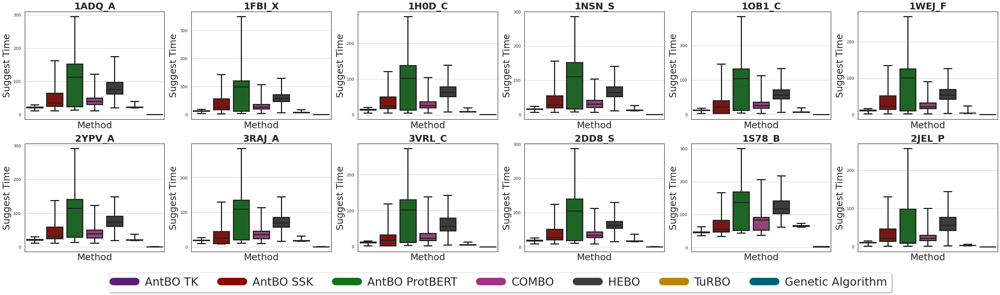

In [ ]:
from tqdm import tqdm 
from copy import deepcopy 

cols = 6
rows = 2
fsize = 25
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize = (6.2*cols, 5*rows))
axs = axs.reshape(rows, cols)
matplotlib.rc('xtick', labelsize=fsize)
matplotlib.rc('ytick', labelsize=fsize)
row, col = 0, 0
plt.xticks(rotation=45)
sns.set_style("white")
for antigen in tqdm(core_antigens):
    
    ax = axs[row, col] 
    if col == (cols-1):
        row += 1
        col = 0
    else:
        col += 1
    ax.set_title(f"{antigen}", fontsize=fsize,fontweight="bold")
    ax.set_xlabel('# Protein Designs', fontsize=fsize)
    ax.set_ylabel('Suggestion Time', fontsize=fsize)
    ax.grid()
    filtered = results[results['Antigen']==antigen]
#     filtered = filtered[filtered.Method!='BObert']
#     ax = sns.lineplot(data=filtered, ax=ax,  x='Num BB Evals', y='Suggest Time', hue = "Method", legend=True)
#     handles, labels = ax.get_legend_handles_labels()
    ax = sns.boxplot(data=filtered,ax=ax, x="Method", y='Suggest Time', order=order_all,linewidth=3, palette=colourDINV, whis=100)
#     filtered = results[results['Antigen'].isin(core_antigens)]
#     filtered = filtered[~filtered['Method'].isin(core_optimisers)]
    ax.set_xticks([])
#     handles, labels = ax.get_legend_handles_labels()
#     ax.get_legend().set_visible(False)

for label_n in order_all:
    if 'Absolut! 6.9M'==label_n:
        pass
    else:
        ax.plot([], color=colourDINV[label_n], label=LabelDict[label_n], linewidth=20, markersize=20)
    
handles, labels = ax.get_legend_handles_labels()
# labels = replace_labels(labels, LabelDict)

# handles_all = handles
# labels_all = labels

n_col_legend = len(handles)
lgd = fig.legend(handles, labels, bbox_to_anchor=(0.5, 0.0), ncol=n_col_legend, loc='upper center', fancybox=True, shadow=True, fontsize=30)
fig.tight_layout()
# plt.tight_layout()
plt.savefig(os.path.join("./plots", "time_vs_funct_evals.pdf"), bbox_extra_artists=(lgd, ), pad_inches=0.1, bbox_inches='tight')
plt.show()
